### 28.05

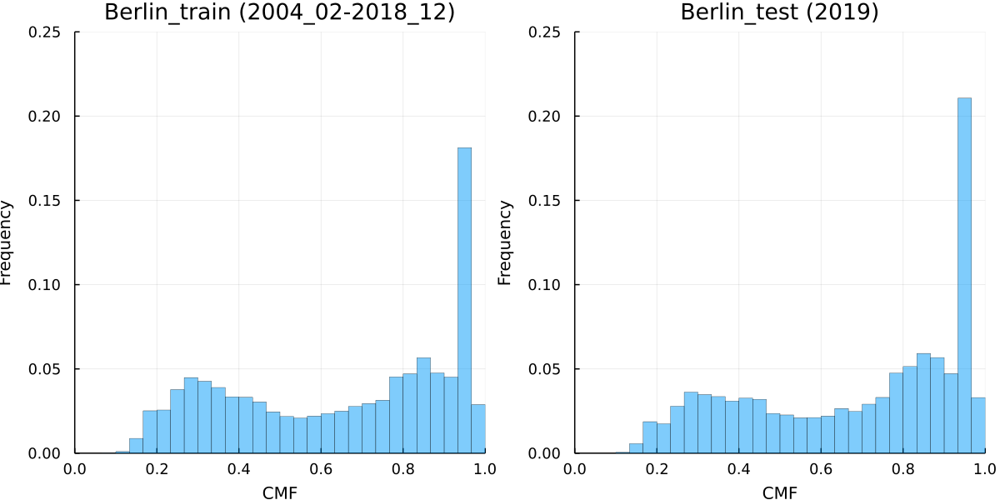

In [97]:
l1 = @layout [a b]
h_el = plot(h_train, h_test, layout=l1, leg=false, lw=0.2, fillalpha=0.5,
    xlim=(0,1), ylim=(0,0.25), xlabel="CMF", ylabel="Frequency", 
    labelfontsize=:9, titlefontsize=:12, dpi=150, size=(800,400), fmt=:png) 

### 1. order

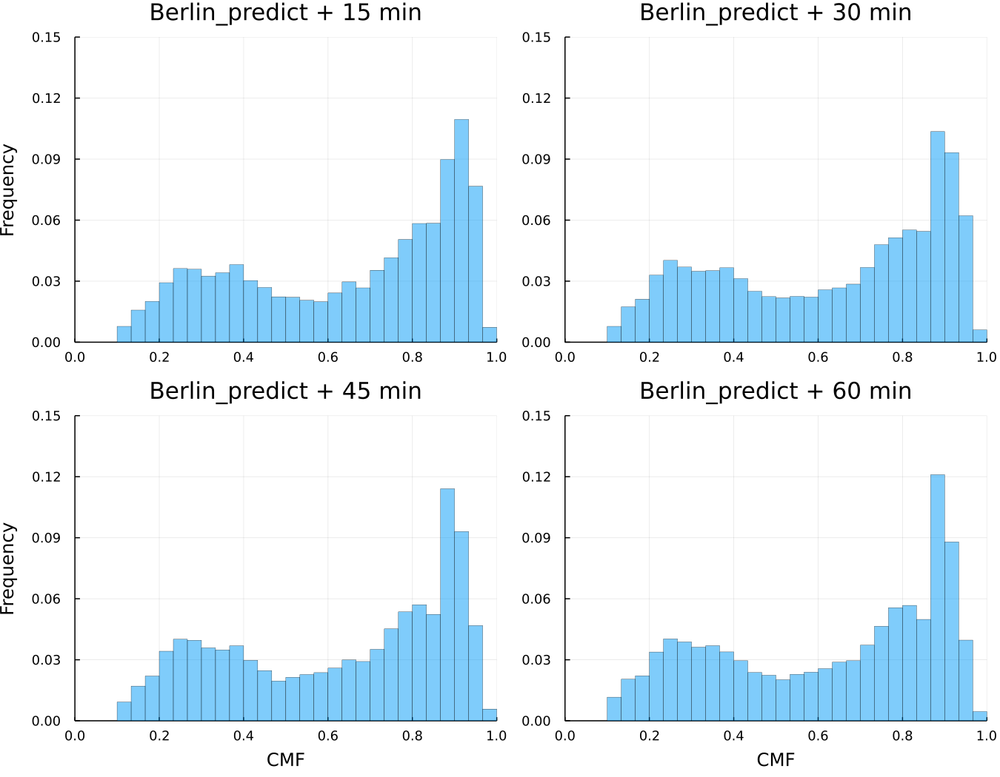

In [15]:
l = @layout [a b; c d]
p = plot(h1, h2, h3, h4, layout=l, leg=false, 
    xlim=(0,1), ylim=(0,0.15),
    lw=0.2, fillalpha=0.5, dpi=:150, size=(900,700))

### 04.06

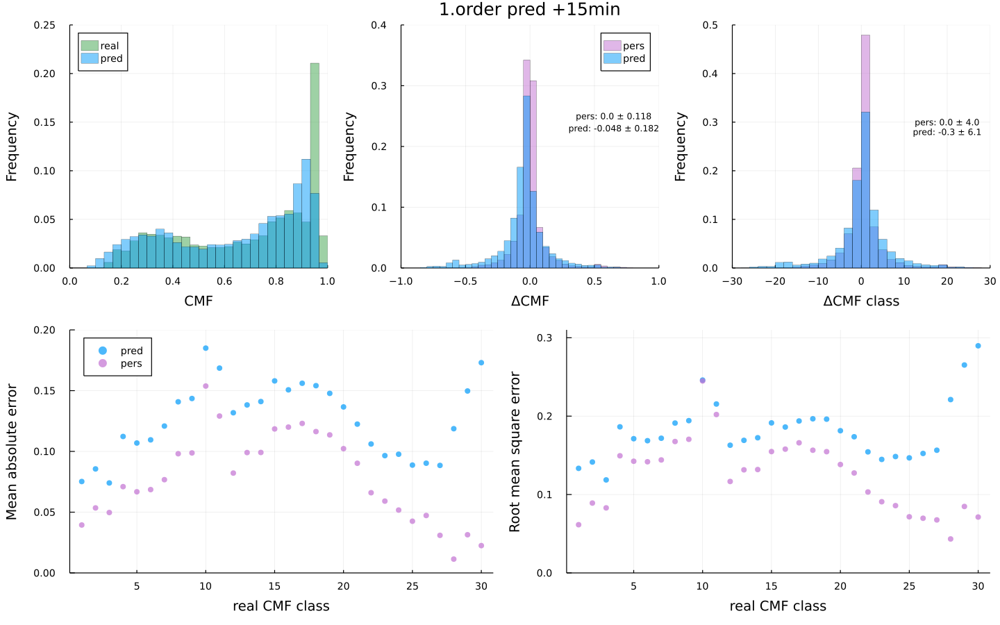

In [22]:
p1 = vizMetrics(1, df1)

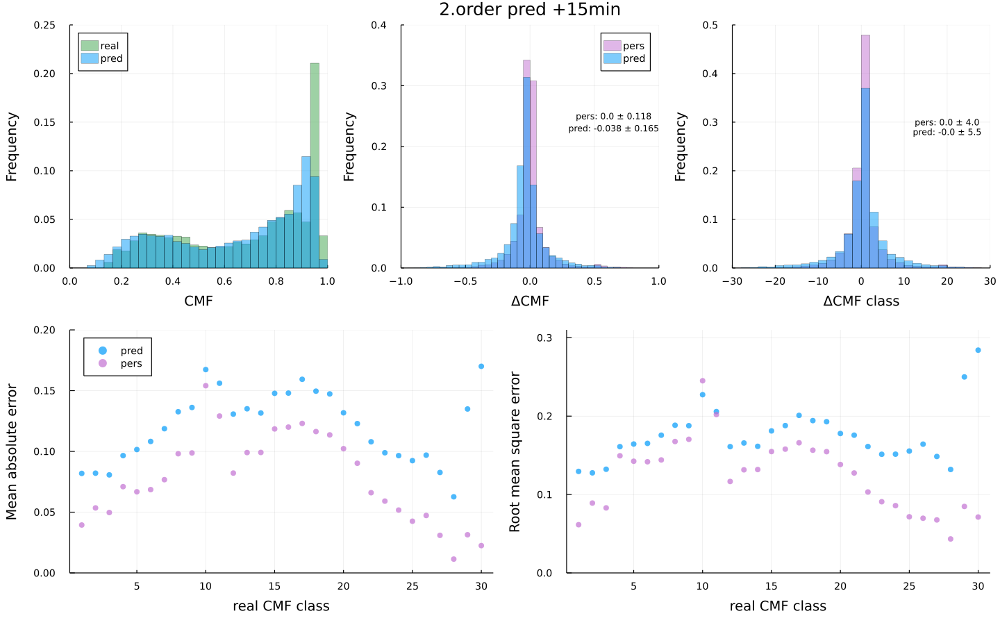

In [23]:
p2 = vizMetrics(2, df2)

- accuracy 2nd. > 1st. > 3rd
- pers mostly more accurate than pred in terms of MAE & RMSE

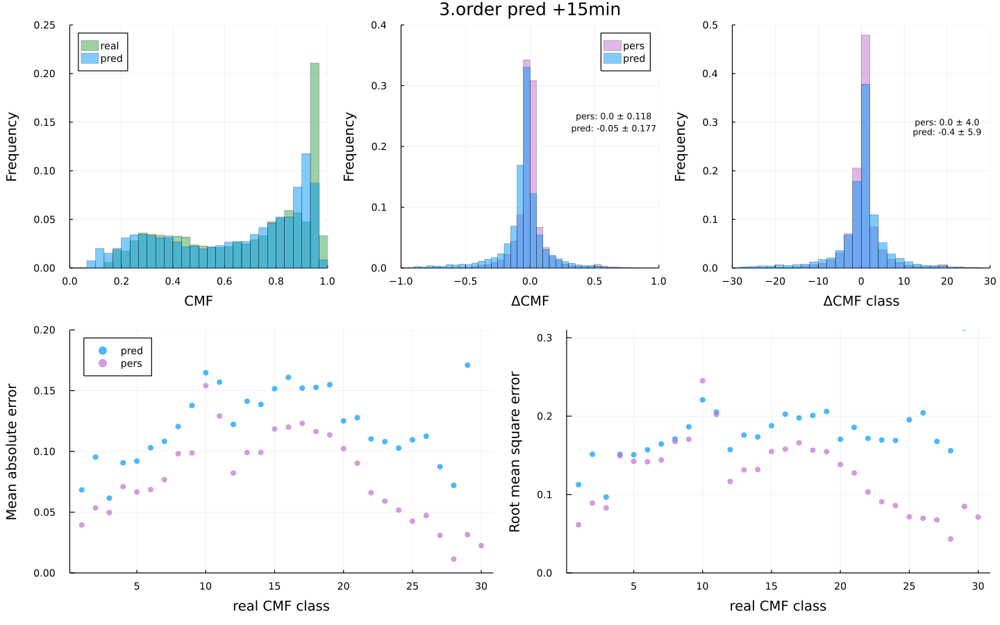

In [24]:
p3 = vizMetrics(3, df3)

In [27]:
p23 = scatter(df[:, :pred], df[:, :dif_pred], leg=false, marker=(0.3, stroke(0)), 
    xlim=(0,1), xlabel="pred. CMF", ylabel="dif (pred - real)")

### 11.06
#### 30 bins of equal population

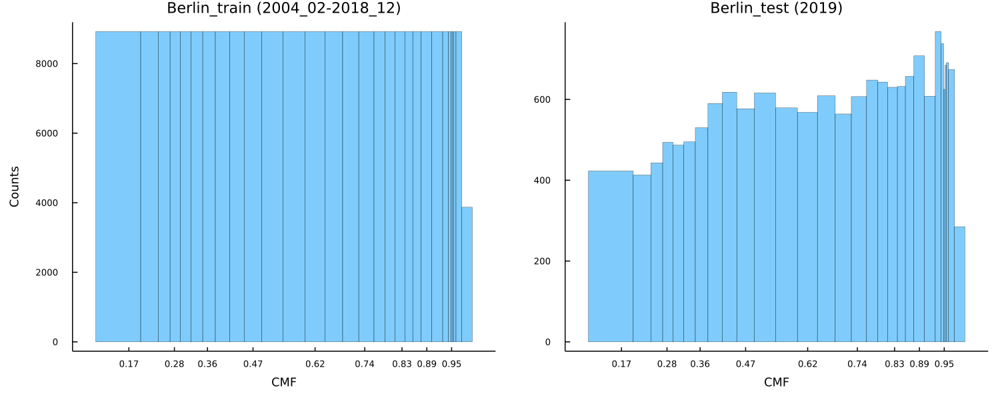

In [94]:
l = @layout [a b]
h_ep = plot(h_train_ep, h_test_ep, layout=l, leg=false, grid=false, xlabel="CMF", 
    lw=0.2, fillalpha=0.5, labelfontsize=8, titlefontsize=10, tickfontsize=6, 
    leftmargin=20px, bottommargin=20px, dpi=150, fmt=:png, size=(1000,400))

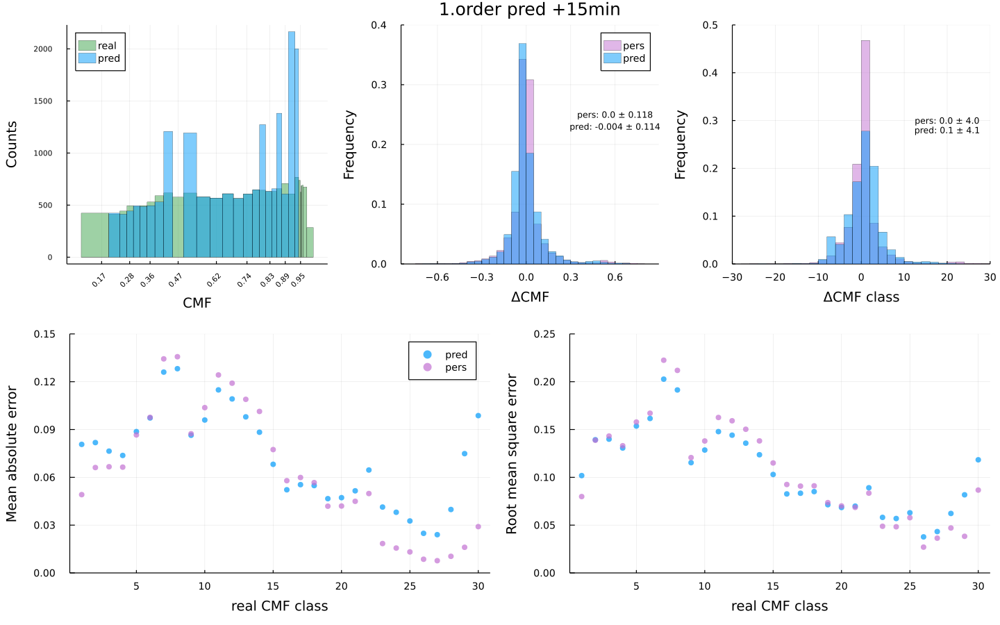

In [110]:
p11 = metrics(1, df11)

- more accurate than bins of equal length 
- in some classes accuracy pred > pers

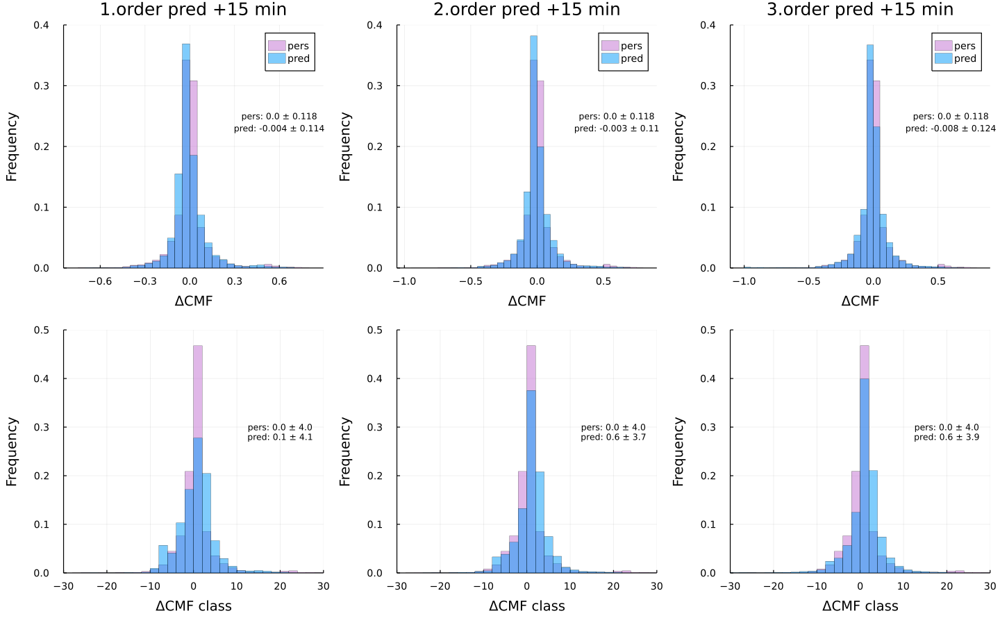

In [137]:
h_dif = plot(h1, h2, h3, h11, h12, h13, layout=@layout([a b c; d e f]), dpi=:120, size=(1200, 750), 
        left_margin=20px, bottom_margin=20px, fmt=:png)

In [37]:
println("30 bins of equal population")
for od in [1,2,3]
    df = getDF(od,1,30)
    mn_dif_pred, sd_dif_pred = rd.( [mean(df.dif_pred), std(df.dif_pred)], 3 )
    mn_dif_cls_pred, sd_dif_cls_pred = rd.( [mean(df.dif_cls_pred), std(df.dif_cls_pred)], 1 )
    println(od, ".order\ndif: ", mn_dif_pred, " ± ", sd_dif_pred)
    println("dif_cls: ", mn_dif_cls_pred, " ± ", sd_dif_cls_pred)
#     @show (mn_dif_pred, sd_dif_pred)
end

30 bins of equal population
1.order
dif: -0.004 ± 0.114
dif_cls: 0.1 ± 4.1
2.order
dif: -0.003 ± 0.11
dif_cls: 0.6 ± 3.7
3.order
dif: -0.008 ± 0.124
dif_cls: 0.6 ± 3.9


- +1 step pred accuracy 2. > 1. > 3. order

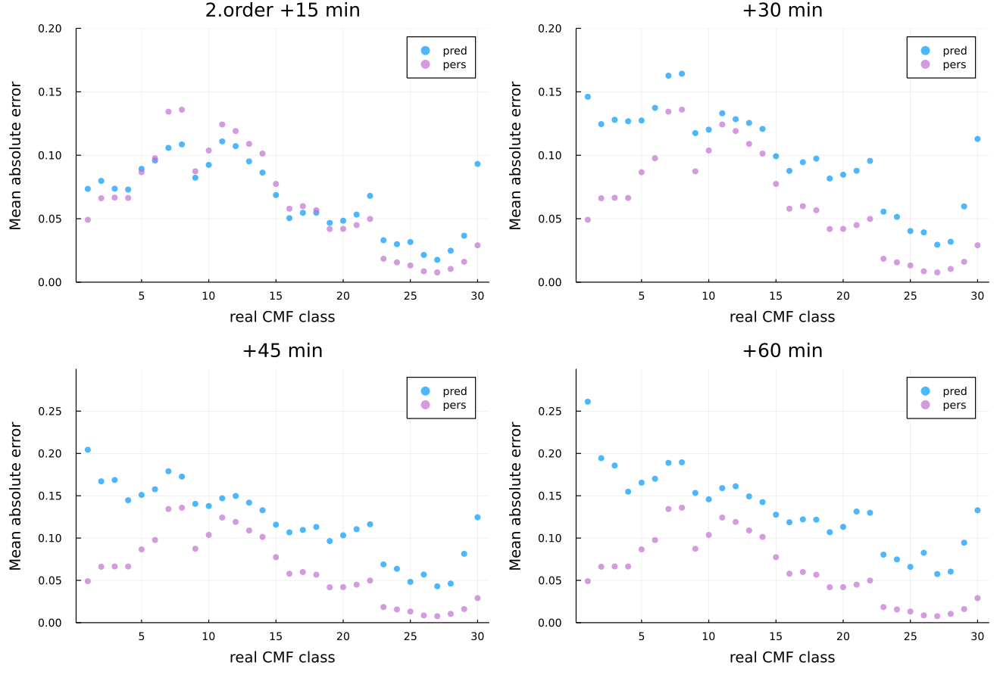

In [43]:
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), dpi=:120, size=(1100, 750), 
        left_margin=20px, bottom_margin=20px, fmt=:png)

- +2, 3, 4 steps pred accuracy < pers

In [9]:
sca = scatter(df21.real, df21.dif_pred, leg=false, marker=(0.3, stroke(0)), title="2.order +15 min",
        xlim=(0,1), xlabel="real CMF", ylabel="dif (pred - real)")

#### Athens

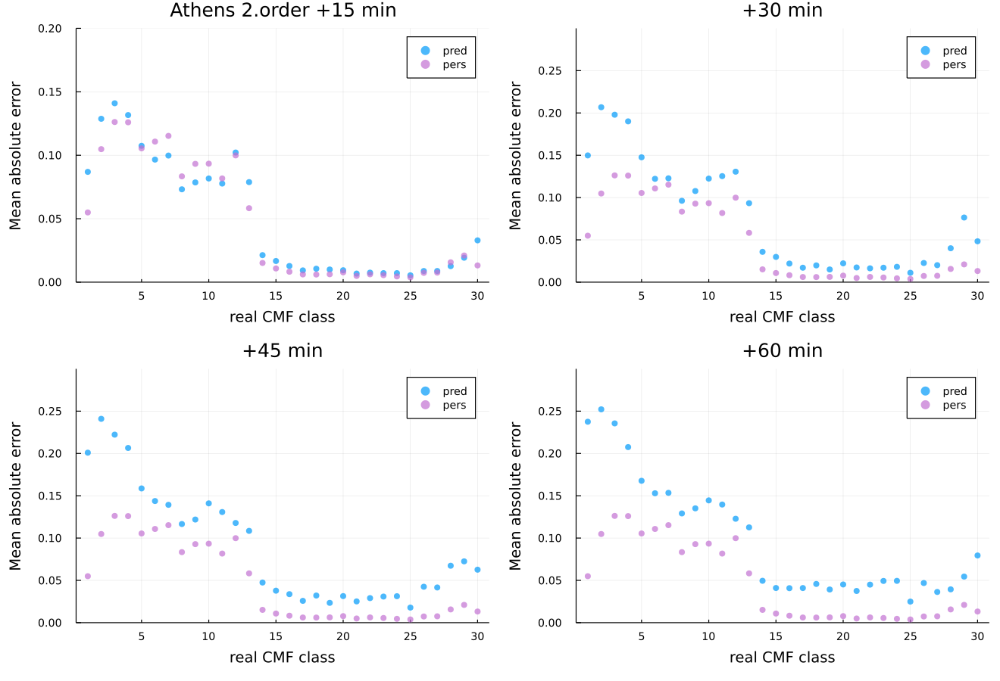

In [6]:
maes = plot(mae1, mae2, mae3, mae4, layout=@layout([a b; c d]), dpi=:120, size=(1100, 750), 
        left_margin=20px, bottom_margin=20px, fmt=:png)

### 18.06
- [x] fixed index error for >= +2 steps
- [x] adjusted prediction scheme for >= +2 steps for 1. - 3. order:
- test MAE in
    - [x] Berlin
    - [ ] Athens

In [ ]:
    for i in 1:length(pred) 
        obs1 = data_test[i] # 9:00
        pred1 = predict_od(obs1, od, T) # pred 9:15
        pred[i] = pred1
        if steps > 1 # +2
            pred2 = predict_od(pred1, od, T) # pred 9:30
            pred[i] = pred2
            if steps > 2 # +3 
                pred3 = predict_od(pred2, od, T) # pred 9:45
                pred[i] = pred3
                if steps > 3 # +4 
                    pred4 = predict_od(pred3, od, T) # pred 10:00
                    pred[i] = pred4          

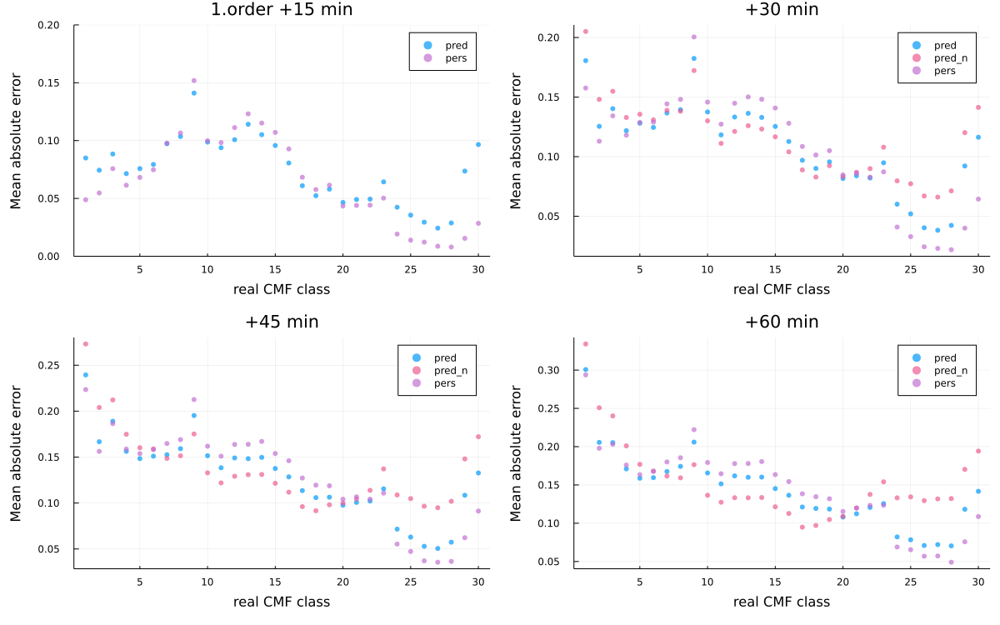

In [26]:
mae_s = plot(mae11, mae12, mae13, mae14, layout=@layout([a b; c d]), size=(1200, 750), #ylim=(0, 0.35),
    left_margin=25px, bottom_margin=25px, fmt=:png)

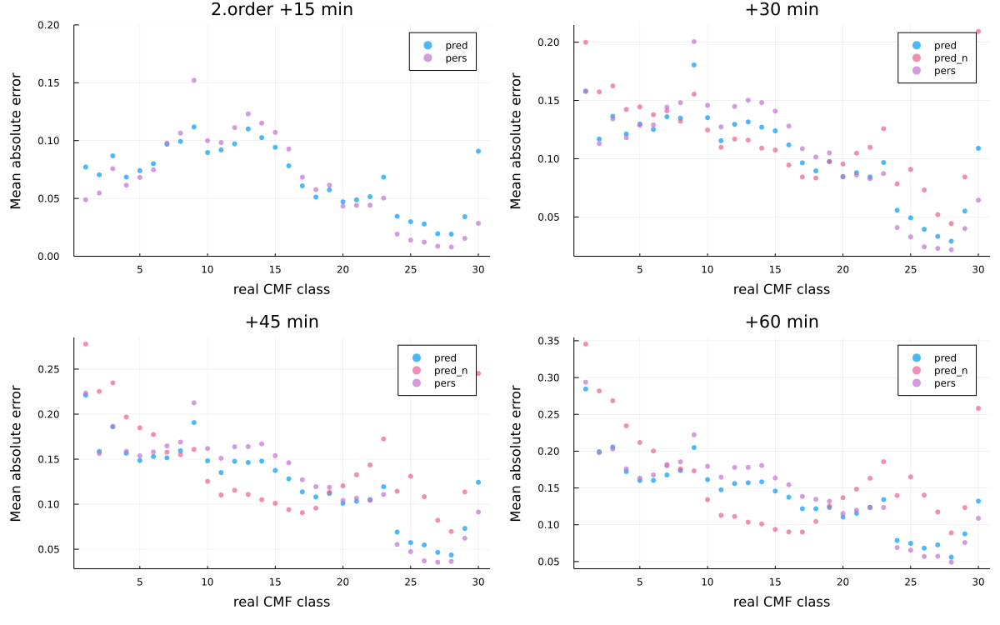

In [56]:
mae2_s = plot(mae21, mae22, mae23, mae24, layout=@layout([a b; c d]), size=(1200, 750), #ylim=(0, 0.35),
    left_margin=25px, bottom_margin=25px, fmt=:png)

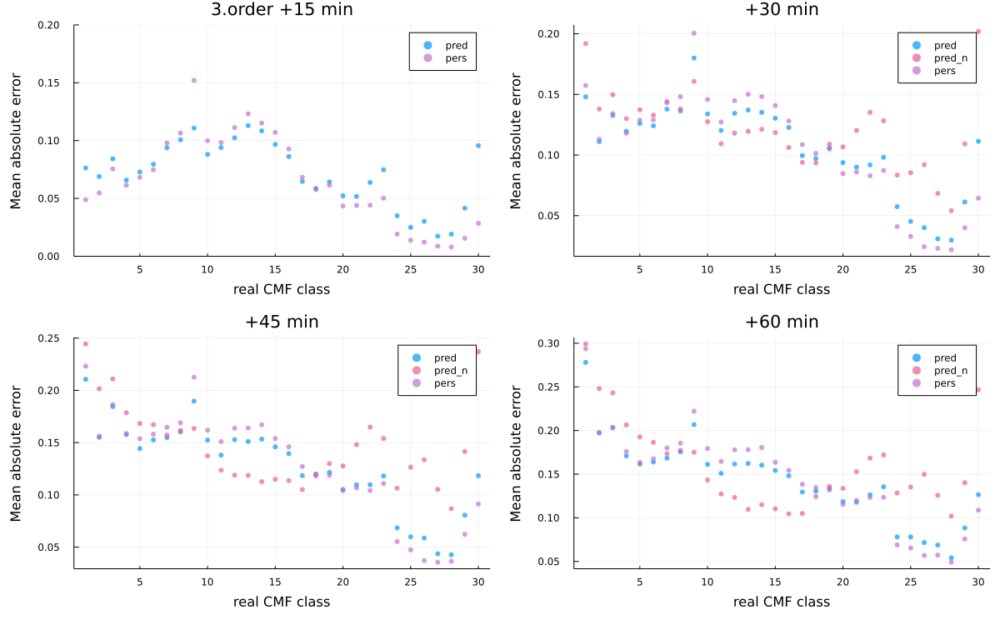

In [73]:
mae33 = viz_mae(df33, "+$(15*3) min")
mae34 = viz_mae(df34, "+$(15*4) min");

mae3 = plot(mae31, mae32, mae33, mae34, layout=@layout([a b; c d]), size=(1200, 750), #ylim=(0, 0.35),
    left_margin=25px, bottom_margin=25px, fmt=:png)

In [87]:
boxes1 = plot(box11, box12, box13, layout=@layout([a b c]),
        leftmargin=20px, dpi=100, size=(1400, 900))

In [88]:
boxes2 = plot(box21, box22, box23, layout=@layout([a b c]),
        leftmargin=20px, dpi=100, size=(1400, 900))

#### First thought for hybrid method
1. classify CMF bins from historical data
2. predict using above three ways
3. compute MAE & RMSE for each class
4. choose corresponding one with min. error for adopted prediction 

TODO
* optimize algorithm